In [1]:
using Random, Distributions, Plots, PlotThemes, LaTeXStrings, Printf
nothing

In [2]:
theme(:vibrant)

Plots.PlotThemes.theme_palette(:vibrant)

We consider the RODE IVP:
$$ \frac{dX_t}{dt} = -Y_t^2 X_t + Y_t , \quad X_0 \sim \mathrm{Beta}(2,2) . $$

In [3]:
function f(X,Y)
    return -Y^2 * X + Y
end

f (generic function with 1 method)

# Brownian noise:

In [4]:
markers = [:x, :utriangle, :square, :circle]

function Euler_method_path_plot_Brownian_noise(T, min_grid_exponent, max_grid_exponent, fine_grid_exponent)
    fine_grid_size = 2^fine_grid_exponent+1
    fine_grid_step = T/(fine_grid_size-1)
    
    W  = Vector{Float64}(undef, fine_grid_size)
    dW = Vector{Float64}(undef, fine_grid_size-1)
    X_exact = Vector{Float64}(undef, fine_grid_size)
        
    rand!(rng, Normal(0,sqrt(fine_grid_step)), dW)
        
    W[1] = 0    
    for i in 1:fine_grid_size-1
        W[i+1] = W[i] .+ dW[i]
    end
        
    X_0 = 0.9
       
    X_exact[1] = X_0
    for i in 1:fine_grid_size-1
        X_exact[i+1] = X_exact[i] + fine_grid_step * f(X_exact[i], W[i])
    end
    
    pl2 = plot(title="", xlabel=L"t", ylabel="", xlim=(-0.01,1.01), ylim=(0.0,1),
        xticks=0:0.25:1, yticks=(0:0.5:1, [replace(@sprintf("%.1f", y), "-" => "−") for y in 0:0.5:1]),
        size=(500,500), grid=true, minorgrid=false, framestyle=:box,
        fontfamily="Computer Modern",  titlefontsize=10, legendfontsize=10, xlabelfontsize=14,
        xtickfont=font(9, "Computer Modern"), ytickfont=font(9, "Computer Modern"), 
        top_margin=-7.5Plots.mm, left_margin=4Plots.mm, legend=:bottomleft)
            
    for grid_exponent in min_grid_exponent:max_grid_exponent
        grid_size = 2^grid_exponent + 1
        grid_step = T/(grid_size-1)
        grid_indexes = 1:2^(fine_grid_exponent - grid_exponent):fine_grid_size
            
        X_Euler = Vector{Float64}(undef, grid_size)
          
        X_Euler[1] = X_0
        for i in 1:grid_size-1
            X_Euler[i+1] = X_Euler[i] + grid_step * f(X_Euler[i], W[grid_indexes[i]])
        end
        
        plot!(pl2, 0:grid_step:T, X_Euler, label=L"m = "*string(grid_exponent),
            color=grid_exponent-min_grid_exponent+1, linewidth=1, marker=markers[grid_exponent-min_grid_exponent+1],
            markersize=3.5, markerstrokewidth=0.5, markerstrokecolor=:black)
    end
    
    plot!(pl2, 0:fine_grid_step:T, X_exact, label="target", color=6, linewidth=2, alpha=0.75)
    
    pl1 = plot(title="", xlabel="", ylabel="", xlim=(-0.01,1.01), ylim=(-2,2), 
        xticks=(0:0.25:1, fill("",5)), yticks=(-2:2:2, [replace(@sprintf("%.1f", y), "-" => "−") for y in -2:2:2]),
        size=(500,500), grid=true, minorgrid=false, framestyle=:box,
        fontfamily="Computer Modern", titlefontsize=10, legendfontsize=10, xlabelfontsize=14,
        xtickfont=font(9, "Computer Modern"), ytickfont=font(9, "Computer Modern"),
        bottom_margin=-7.5Plots.mm, left_margin=4Plots.mm)

    plot!(pl1, 0:fine_grid_step:T, W, label="Brownian noise path")
        
    pl = plot(pl1, pl2; layout=(2,1), size=(800,400), right_margin=-3.5Plots.mm)

    function add_centered_ylabel!(plt, i, label::LaTeXString; fontsize=12, x_offset_frac=0.08)
        # get axis limits for subplot i
        xlo, xhi = xlims(plt[i])
        ylo, yhi = ylims(plt[i])

        # choose a position slightly left of the leftmost x (data coordinates)
        dx = xhi - xlo
        xpos = xlo - x_offset_frac * dx   # move left by fraction of axis width

        # vertical center
        ypos = (ylo + yhi) / 2

        # add annotation (rotation in degrees)
        annotate!(plt[i], xpos, ypos, text(label, fontsize, halign=:center, rotation=90))
    end
    
    add_centered_ylabel!(pl, 1, L"B_t", fontsize=14)
    add_centered_ylabel!(pl, 2, L"X_t", fontsize=14)

    return pl
end


T = 1

min_grid_exponent = 2
max_grid_exponent = 5
fine_grid_exponent = 16

rng = Xoshiro(234)

pl1 = Euler_method_path_plot_Brownian_noise(T, min_grid_exponent, max_grid_exponent, fine_grid_exponent)

nothing
#display(pl1)

In [5]:
function Euler_method_strong_errors_Brownian_noise(T, min_grid_exponent, max_grid_exponent, fine_grid_exponent, sample_size)    
    fine_grid_size = 2^fine_grid_exponent+1
    fine_grid_step = T/(fine_grid_size-1)
    
    W  = Vector{Float64}(undef, fine_grid_size)
    dW = Vector{Float64}(undef, fine_grid_size-1)
    X_exact = Vector{Float64}(undef, fine_grid_size)
            
    errors = Matrix{Float64}(undef, max_grid_exponent-min_grid_exponent+1, sample_size)
    
    for n in 1:sample_size
        rand!(rng, Normal(0,sqrt(fine_grid_step)), dW)
        
        W[1] = 0    
        for i in 1:fine_grid_size-1
            W[i+1] = W[i] .+ dW[i]
        end

        
        X_0 = rand(rng, Beta(2,2))
        #X_0 = 1
        
        X_exact[1] = X_0
        for i in 1:fine_grid_size-1
            X_exact[i+1] = X_exact[i] + fine_grid_step * f(X_exact[i], W[i])
        end
            
        for grid_exponent in min_grid_exponent:max_grid_exponent
            grid_size = 2^grid_exponent + 1
            grid_step = T/(grid_size-1)
            grid_indexes = 1:2^(fine_grid_exponent - grid_exponent):fine_grid_size
            
            X_Euler = Vector{Float64}(undef, grid_size)
            
            X_Euler[1] = X_0
            for i in 1:grid_size-1
                X_Euler[i+1] = X_Euler[i] + grid_step * f(X_Euler[i], W[grid_indexes[i]])
            end
            
            errors[grid_exponent-min_grid_exponent+1, n] = maximum(abs.(X_Euler-X_exact[grid_indexes]))
        end
    end
    
    return mean(errors, dims=2)
end

    
T = 1

min_grid_exponent = 2
max_grid_exponent = 8
fine_grid_exponent = 16
sample_size = 10_000

strong_errors = Euler_method_strong_errors_Brownian_noise(T,min_grid_exponent,max_grid_exponent,fine_grid_exponent,sample_size)

grid_steps = T ./ (2 .^(min_grid_exponent:1:max_grid_exponent))
log_grid_steps = log2.(grid_steps)
    
log_strong_errors = log2.(strong_errors)
X = [ones(size(log_grid_steps)) log_grid_steps]
p = X \ log_strong_errors
    
pl2 = plot(title="", xlabel=L"\log_{\!2}\,\Delta t", 
    size=(400,400), grid=true, minorgrid=false, framestyle=:box,
    fontfamily="Computer Modern", titlefontsize=15, legendfontsize=12, xlabelfontsize=14,
    xtickfont=font(9, "Computer Modern"), ytickfont=font(9, "Computer Modern"),
    left_margin=-3.5Plots.mm)

scatter!(pl2, [], [], markershape=:circle, label=L"\log_{\!2}\,\mathrm{error}(\Delta t)", color=1, markerstrokewidth=1,
        markerstrokecolor=:black, markeralpha=0.9)
        
plot!(pl2, log_grid_steps, p[1] .+ p[2] .* log_grid_steps, label=L"C(\Delta t)^p"*" fit with p = "*@sprintf("%.2f", p[2]),
    color=2, linewidth=2)

scatter!(pl2, log_grid_steps, log_strong_errors, markershape=:circle, label="", color=1, markerstrokewidth=1,
        markerstrokecolor=:black, markeralpha=0.9)

nothing
#display(pl2)

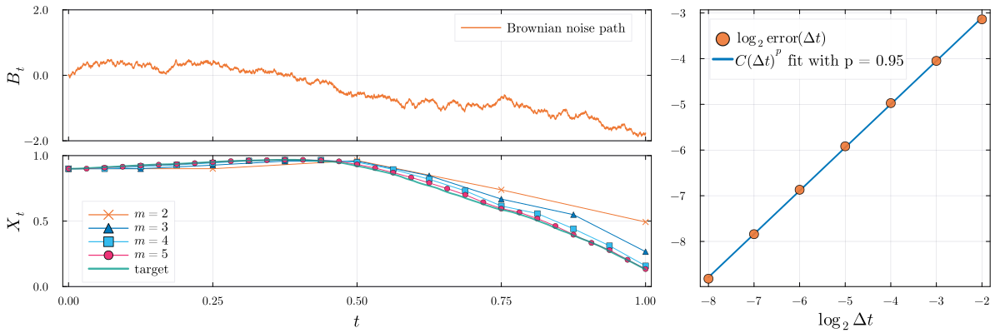

In [6]:
layout = @layout [a{0.67w} b{0.33w}]
pl = plot(pl1, pl2; layout=layout, size=(1200,400), bottom_margin=6Plots.mm, left_margin=6Plots.mm)
display(pl)

In [7]:
savefig(pl, "Euler_method_Brownian.pdf")

"C:\\Users\\luan_\\OneDrive\\Desktop\\Projeto Mestrado\\9 - Dissertação\\Euler_method_Brownian.pdf"

# Onstein-Uhlenbeck noise:

In [8]:
markers = [:x, :utriangle, :square, :circle]

function Euler_method_path_plot_OU_noise(T, min_grid_exponent, max_grid_exponent, fine_grid_exponent)
    fine_grid_size = 2^fine_grid_exponent+1
    fine_grid_step = T/(fine_grid_size-1)
    
    OU = Vector{Float64}(undef, fine_grid_size)
    OU_random_increments = Vector{Float64}(undef, fine_grid_size-1)
    X_exact = Vector{Float64}(undef, fine_grid_size)
    
    ν = 1
    σ = 1
    
    s = σ * sqrt((1 - exp(-2*ν*fine_grid_step))/(2*ν))

    rand!(rng, Normal(0,s), OU_random_increments)
    
    OU[1] = rand(rng, Normal(0,1))

    for i in 1:fine_grid_size-1
        OU[i+1] = OU[i] * exp(-ν*fine_grid_step) + OU_random_increments[i]
    end
        
    X_0 = 0.9
       
    X_exact[1] = X_0
    for i in 1:fine_grid_size-1
        X_exact[i+1] = X_exact[i] + fine_grid_step * f(X_exact[i], OU[i])
    end
    
    pl2 = plot(title="", xlabel=L"t", ylabel="", xlim=(-0.01,1.01), ylim=(0.25,1),
        xticks=0:0.25:1, yticks=(0.25:0.25:1, [replace(@sprintf("%.2f", y), "-" => "−") for y in 0.25:0.25:1]),
        size=(500,500), grid=true, minorgrid=false, framestyle=:box,
        fontfamily="Computer Modern",  titlefontsize=10, legendfontsize=10, xlabelfontsize=14,
        xtickfont=font(9, "Computer Modern"), ytickfont=font(9, "Computer Modern"), 
        top_margin=-7.5Plots.mm, left_margin=4Plots.mm, legend=:bottomleft)

    for grid_exponent in min_grid_exponent:max_grid_exponent
        grid_size = 2^grid_exponent + 1
        grid_step = T/(grid_size-1)
        grid_indexes = 1:2^(fine_grid_exponent - grid_exponent):fine_grid_size
            
        X_Euler = Vector{Float64}(undef, grid_size)
          
        X_Euler[1] = X_0
        for i in 1:grid_size-1
            X_Euler[i+1] = X_Euler[i] + grid_step * f(X_Euler[i], OU[grid_indexes[i]])
        end
        
        plot!(pl2, 0:grid_step:T, X_Euler, label=L"m = "*string(grid_exponent),
            color=grid_exponent-min_grid_exponent+1, linewidth=1, marker=markers[grid_exponent-min_grid_exponent+1],
            markersize=3.5, markerstrokewidth=0.5, markerstrokecolor=:black)
    end
    
    plot!(pl2, 0:fine_grid_step:T, X_exact, label="target", color=6, linewidth=2, alpha=0.75)
    
    pl1 = plot(title="", xlabel="", ylabel="", xlim=(-0.01,1.01), ylim=(-2,2), 
        xticks=(0:0.25:1, fill("",5)), yticks=(-2:2:2, [replace(@sprintf("%.1f", y), "-" => "−") for y in -2:2:2]),
        size=(500,500), grid=true, minorgrid=false, framestyle=:box,
        fontfamily="Computer Modern", titlefontsize=10, legendfontsize=10, xlabelfontsize=14,
        xtickfont=font(9, "Computer Modern"), ytickfont=font(9, "Computer Modern"),
        bottom_margin=-7.5Plots.mm, left_margin=4Plots.mm)

    plot!(pl1, 0:fine_grid_step:T, OU, label="Ornstein-Uhlenbeck noise path", bottom_margin=-7.5Plots.mm, left_margin=4Plots.mm)
        
    pl = plot(pl1, pl2; layout=(2,1), size=(800,400), right_margin=-3.5Plots.mm)

    function add_centered_ylabel!(plt, i, label::LaTeXString; fontsize=12, x_offset_frac=0.08)
        # get axis limits for subplot i
        xlo, xhi = xlims(plt[i])
        ylo, yhi = ylims(plt[i])

        # choose a position slightly left of the leftmost x (data coordinates)
        dx = xhi - xlo
        xpos = xlo - x_offset_frac * dx   # move left by fraction of axis width

        # vertical center
        ypos = (ylo + yhi) / 2

        # add annotation (rotation in degrees)
        annotate!(plt[i], xpos, ypos, text(label, fontsize, halign=:center, rotation=90))
    end
    
    add_centered_ylabel!(pl, 1, L"O_t", fontsize=14)
    add_centered_ylabel!(pl, 2, L"X_t", fontsize=14)

    return pl
end


T = 1

min_grid_exponent = 2
max_grid_exponent = 5
fine_grid_exponent = 16

rng = Xoshiro(444)

pl1 = Euler_method_path_plot_OU_noise(T, min_grid_exponent, max_grid_exponent, fine_grid_exponent)

nothing
#display(pl1)

In [9]:
function Euler_method_strong_errors_OU_noise(T, min_grid_exponent, max_grid_exponent, fine_grid_exponent, sample_size)    
    fine_grid_size = 2^fine_grid_exponent+1
    fine_grid_step = T/(fine_grid_size-1)
    
    OU = Vector{Float64}(undef, fine_grid_size)
    OU_random_increments = Vector{Float64}(undef, fine_grid_size-1)
    X_exact = Vector{Float64}(undef, fine_grid_size)
    
    ν = 1
    σ = 1
    
    s = σ * sqrt((1 - exp(-2*ν*fine_grid_step))/(2*ν))
    
    errors = Matrix{Float64}(undef, max_grid_exponent-min_grid_exponent+1, sample_size)
    
    for n in 1:sample_size
        rand!(rng, Normal(0,s), OU_random_increments)
    
        OU[1] = rand(rng, Normal(0,1))

        for i in 1:fine_grid_size-1
            OU[i+1] = OU[i] * exp(-ν*fine_grid_step) + OU_random_increments[i]
        end
        
        X_0 = rand(rng, Beta(2,2))
        #X_0 = 1
        
        X_exact[1] = X_0
        for i in 1:fine_grid_size-1
            X_exact[i+1] = X_exact[i] + fine_grid_step * f(X_exact[i], OU[i])
        end
            
        for grid_exponent in min_grid_exponent:max_grid_exponent
            grid_size = 2^grid_exponent + 1
            grid_step = T/(grid_size-1)
            grid_indexes = 1:2^(fine_grid_exponent - grid_exponent):fine_grid_size
            
            X_Euler = Vector{Float64}(undef, grid_size)
            
            X_Euler[1] = X_0
            for i in 1:grid_size-1
                X_Euler[i+1] = X_Euler[i] + grid_step * f(X_Euler[i], OU[grid_indexes[i]])
            end
            
            errors[grid_exponent-min_grid_exponent+1, n] = maximum(abs.(X_Euler-X_exact[grid_indexes]))
        end
    end
    
    return mean(errors, dims=2)
end

    
T = 1

min_grid_exponent = 2
max_grid_exponent = 8
fine_grid_exponent = 16
sample_size = 10_000

strong_errors = Euler_method_strong_errors_OU_noise(T,min_grid_exponent,max_grid_exponent,fine_grid_exponent,sample_size)

grid_steps = T ./ (2 .^(min_grid_exponent:1:max_grid_exponent))
log_grid_steps = log2.(grid_steps)
    
log_strong_errors = log2.(strong_errors)
X = [ones(size(log_grid_steps)) log_grid_steps]
p = X \ log_strong_errors
    
pl2 = plot(title="", xlabel=L"\log_{\!2}\,\Delta t", 
    size=(400,400), grid=true, minorgrid=false, framestyle=:box,
    fontfamily="Computer Modern", titlefontsize=15, legendfontsize=12, xlabelfontsize=14,
    xtickfont=font(9, "Computer Modern"), ytickfont=font(9, "Computer Modern"),
    left_margin=-3.5Plots.mm)

scatter!(pl2, [], [], markershape=:circle, label=L"\log_{\!2}\,\mathrm{error}(\Delta t)", color=1, markerstrokewidth=1,
        markerstrokecolor=:black, markeralpha=0.9)
        
plot!(pl2, log_grid_steps, p[1] .+ p[2] .* log_grid_steps, label=L"C(\Delta t)^p"*" fit with p = "*@sprintf("%.2f", p[2]),
    color=2, linewidth=2)

scatter!(pl2, log_grid_steps, log_strong_errors, markershape=:circle, label="", color=1, markerstrokewidth=1,
        markerstrokecolor=:black, markeralpha=0.9)

nothing
#display(pl2)

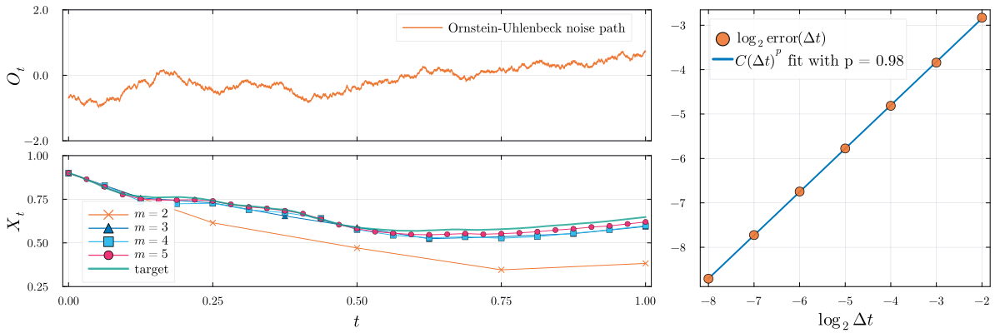

In [10]:
layout = @layout [a{0.67w} b{0.33w}]
pl = plot(pl1, pl2; layout=layout, size=(1200,400), bottom_margin=6Plots.mm, left_margin=6Plots.mm)
display(pl)

In [11]:
savefig(pl, "Euler_method_Ornstein-Uhlenbeck.pdf")

"C:\\Users\\luan_\\OneDrive\\Desktop\\Projeto Mestrado\\9 - Dissertação\\Euler_method_Ornstein-Uhlenbeck.pdf"

# Poisson process

In [12]:
markers = [:x, :utriangle, :square, :circle]

function Euler_method_path_plot_Poisson_noise(T, min_grid_exponent, max_grid_exponent, fine_grid_exponent)
    fine_grid_size = 2^fine_grid_exponent+1
    fine_grid_step = T/(fine_grid_size-1)    
    fine_grid = collect(0:fine_grid_step:T)

    elapsed_t = 0

    P = zeros(fine_grid_size)

    while elapsed_t <= 1
        elapsed_t += rand(rng, Exponential(1))
        P +=  (fine_grid .>= elapsed_t) 
    end

    X_exact = Vector{Float64}(undef, fine_grid_size)

    X_0 = 0.9
    
    X_exact[1] = X_0
    for i in 1:fine_grid_size-1
        X_exact[i+1] = X_exact[i] + fine_grid_step * f(X_exact[i], P[i])
    end
    
    pl2 = plot(title="", xlabel=L"t", ylabel="", xlim=(-0.01,1.01), ylim=(0,1), size=(500,500),
        fontfamily="Computer Modern", grid=true, titlefontsize=10, legendfontsize=10, xlabelfontsize=14,
        xtickfont=font(9, "Computer Modern"), ytickfont=font(9, "Computer Modern"), 
        framestyle=:box, xticks=0:0.25:1, yticks=(0:0.5:1, [replace(@sprintf("%.2f", y), "-" => "−") for y in 0:0.5:1]),
        minorgrid=false, top_margin=-7.5Plots.mm, left_margin=4Plots.mm, legend=:bottomleft)
            
    for grid_exponent in min_grid_exponent:max_grid_exponent
        grid_size = 2^grid_exponent + 1
        grid_step = T/(grid_size-1)
        grid_indexes = 1:2^(fine_grid_exponent - grid_exponent):fine_grid_size
            
        X_Euler = Vector{Float64}(undef, grid_size)
          
        X_Euler[1] = X_0
        for i in 1:grid_size-1
            X_Euler[i+1] = X_Euler[i] + grid_step * f(X_Euler[i], P[grid_indexes[i]])
        end
        
        plot!(pl2, 0:grid_step:T, X_Euler, label=L"m = "*string(grid_exponent),
            color=grid_exponent-min_grid_exponent+1, linewidth=1, marker=markers[grid_exponent-min_grid_exponent+1],
            markersize=3.5, markerstrokewidth=0.5, markerstrokecolor=:black)
    end
    
    plot!(pl2, 0:fine_grid_step:T, X_exact, label="target", color=6, linewidth=2, alpha=0.75)
    
    pl1 = plot(title="", xlabel="", ylabel="", xlim=(-0.01,1.01), ylim=(-0.1,3.1), 
        xticks=(0:0.25:1, fill("",5)), yticks=(0:1:3, [replace(@sprintf("%.1f", y), "-" => "−") for y in 0:1:3]),
        size=(500,500), grid=true, minorgrid=false, framestyle=:box,
        fontfamily="Computer Modern", titlefontsize=10, legendfontsize=10, xlabelfontsize=14,
        xtickfont=font(9, "Computer Modern"), ytickfont=font(9, "Computer Modern"),
        bottom_margin=-7.5Plots.mm, left_margin=4Plots.mm)

    plot!(pl1, 0:fine_grid_step:T, P, label="Poisson noise path", linewidth=2)
        
    pl = plot(pl1, pl2; layout=(2,1), size=(800,400), right_margin=-5Plots.mm)
    #pl = plot(pl1, pl2; layout=(2,1), size=(800,400))

    function add_centered_ylabel!(plt, i, label::LaTeXString; fontsize=12, x_offset_frac=0.08)
        # get axis limits for subplot i
        xlo, xhi = xlims(plt[i])
        ylo, yhi = ylims(plt[i])

        # choose a position slightly left of the leftmost x (data coordinates)
        dx = xhi - xlo
        xpos = xlo - x_offset_frac * dx   # move left by fraction of axis width

        # vertical center
        ypos = (ylo + yhi) / 2

        # add annotation (rotation in degrees)
        annotate!(plt[i], xpos, ypos, text(label, fontsize, halign=:center, rotation=90))
    end
    
    add_centered_ylabel!(pl, 1, L"P_t", fontsize=14)
    add_centered_ylabel!(pl, 2, L"X_t", fontsize=14)

    return pl
end


T = 1

min_grid_exponent = 2
max_grid_exponent = 5
fine_grid_exponent = 16

rng = Xoshiro(22)

pl1 = Euler_method_path_plot_Poisson_noise(T, min_grid_exponent, max_grid_exponent, fine_grid_exponent)

nothing
#display(pl1)

In [13]:
function Euler_method_strong_errors_Poisson_noise(T, min_grid_exponent, max_grid_exponent, fine_grid_exponent, sample_size)    
    fine_grid_size = 2^fine_grid_exponent+1
    fine_grid_step = T/(fine_grid_size-1)
    fine_grid = collect(0:fine_grid_step:T)

    P = Vector{Float64}(undef, fine_grid_size)
    X_exact = Vector{Float64}(undef, fine_grid_size)
    
    errors = Matrix{Float64}(undef, max_grid_exponent-min_grid_exponent+1, sample_size)
    
    for n in 1:sample_size
        fill!(P, 0)
    
        elapsed_t = 0

        while elapsed_t <= 1
            elapsed_t += rand(rng, Exponential(1))
            P += (fine_grid .>= elapsed_t) 
        end
        
        X_0 = rand(rng, Beta(2,2))
        #X_0 = 1
        
        X_exact[1] = X_0
        for i in 1:fine_grid_size-1
            X_exact[i+1] = X_exact[i] + fine_grid_step * f(X_exact[i], P[i])
        end
            
        for grid_exponent in min_grid_exponent:max_grid_exponent
            grid_size = 2^grid_exponent + 1
            grid_step = T/(grid_size-1)
            grid_indexes = 1:2^(fine_grid_exponent - grid_exponent):fine_grid_size
            
            X_Euler = Vector{Float64}(undef, grid_size)
            
            X_Euler[1] = X_0
            for i in 1:grid_size-1
                X_Euler[i+1] = X_Euler[i] + grid_step * f(X_Euler[i], P[grid_indexes[i]])
            end
            
            errors[grid_exponent-min_grid_exponent+1, n] = maximum(abs.(X_Euler-X_exact[grid_indexes]))
        end
    end
    
    return mean(errors, dims=2)
end

    
T = 1

min_grid_exponent = 2
max_grid_exponent = 8
fine_grid_exponent = 19
sample_size = 10_000

strong_errors = Euler_method_strong_errors_Poisson_noise(T,min_grid_exponent,max_grid_exponent,fine_grid_exponent,sample_size)

grid_steps = T ./ (2 .^(min_grid_exponent:1:max_grid_exponent))
log_grid_steps = log2.(grid_steps)
    
log_strong_errors = log2.(strong_errors)
X = [ones(size(log_grid_steps)) log_grid_steps]
p = X \ log_strong_errors
    
pl2 = plot(title="", xlabel=L"\log_{\!2}\,\Delta t", 
    size=(400,400), grid=true, minorgrid=false, framestyle=:box,
    fontfamily="Computer Modern", titlefontsize=15, legendfontsize=12, xlabelfontsize=14,
    xtickfont=font(9, "Computer Modern"), ytickfont=font(9, "Computer Modern"),
    left_margin=-3.5Plots.mm)

scatter!(pl2, [], [], markershape=:circle, label=L"\log_{\!2}\,\mathrm{error}(\Delta t)", color=1, markerstrokewidth=1,
        markerstrokecolor=:black, markeralpha=0.9)
        
plot!(pl2, log_grid_steps, p[1] .+ p[2] .* log_grid_steps, label=L"C(\Delta t)^p"*" fit with p = "*@sprintf("%.2f", p[2]),
    color=2, linewidth=2)

scatter!(pl2, log_grid_steps, log_strong_errors, markershape=:circle, label="", color=1, markerstrokewidth=1,
        markerstrokecolor=:black, markeralpha=0.9)

nothing
#display(pl2)

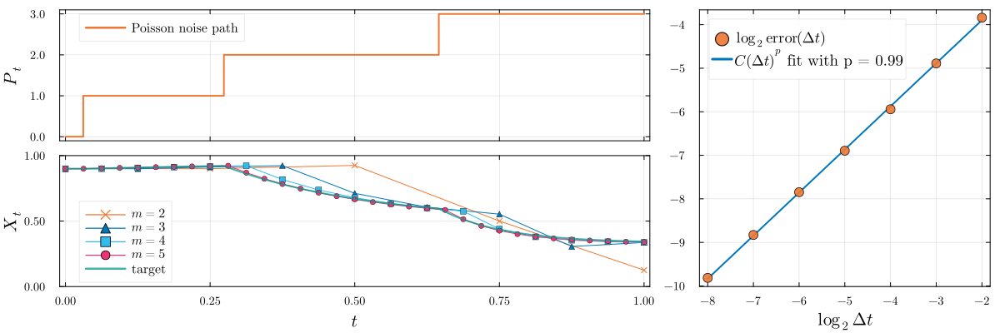

In [14]:
layout = @layout [a{0.67w} b{0.33w}]
pl = plot(pl1, pl2; layout=layout, size=(1200,400), bottom_margin=6Plots.mm, left_margin=6Plots.mm)
display(pl)

In [15]:
savefig(pl, "Euler_method_Poisson.pdf")

"C:\\Users\\luan_\\OneDrive\\Desktop\\Projeto Mestrado\\9 - Dissertação\\Euler_method_Poisson.pdf"